A ideia é retirar os footers e headers das imagens a partir de uma imagem inserida. as novas imagens serão salvas numa nova pasta, mas com o mesmo nome

##Falta só fazer uma interface pelo streamlit para seleção de tamanho de crop, seleção de imagens e organização das pastas

In [129]:
!sudo apt-get install -y poppler-utils
!pip install pdf2image

Reading package lists... Done
Building dependency tree       
Reading state information... Done
poppler-utils is already the newest version (0.62.0-2ubuntu2.12).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [130]:
from google.colab import drive
import os

root_path = '/content/drive/'
cur_path = '/content/drive/My Drive/ic/cropSelection/'
pdf_path = '/content/drive/My Drive/ic/cropSelection/pdfs'
img_path = '/content/drive/My Drive/ic/cropSelection/imgs'

drive.mount(root_path)
os.chdir(cur_path)

#print(os.getcwd())

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [131]:
from pdf2image import convert_from_path
import cv2
import numpy

# depois inserir conversão da imagem com cores corretas e parsing correto do nome

# conversion shenanigans
img_dir_list = os.listdir(img_path)
print(img_dir_list)

for pdf in os.listdir(pdf_path):
 img_pages = convert_from_path(pdf_path + '/' + pdf)
 for i in range(len(img_pages)):

   pdf = pdf.replace('.pdf', '')
   
   # cria repositório das paginas de pdf  
   if f'{pdf}' not in img_dir_list:
     os.mkdir(f"{img_path}/{pdf}")

   cv2.imwrite(f'imgs/{pdf}/{i}.jpg', cv2.cvtColor(numpy.array(img_pages[i]), cv2.COLOR_BGR2GRAY))

# crop area
# for img in os.listdir(cur_path + '/crop_selection'):
#   crop_selection = cv2.cvtColor(numpy.array(cv2.imread(cur_path + '/crop_selection/' + img)), cv2.COLOR_BGR2GRAY)

['1000095-73.2018.8.26.0651_168721135 - 1_Peticao']


In [132]:
from google.colab.patches import cv2_imshow

# full
img_dir_list = os.listdir(img_path)

for pdf in img_dir_list:
  img_list = []
  
  for page in os.listdir(f'{img_path}/{pdf}'):
    full_image = cv2.imread(f"{img_path}/{pdf}/{page}")
    img_list.append(full_image)

cropped = full_image[2189:2275, 560:1090]

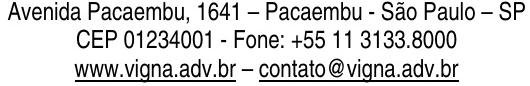

In [133]:
cv2_imshow(cropped)

-0.15791355073451996 0.15775130689144135


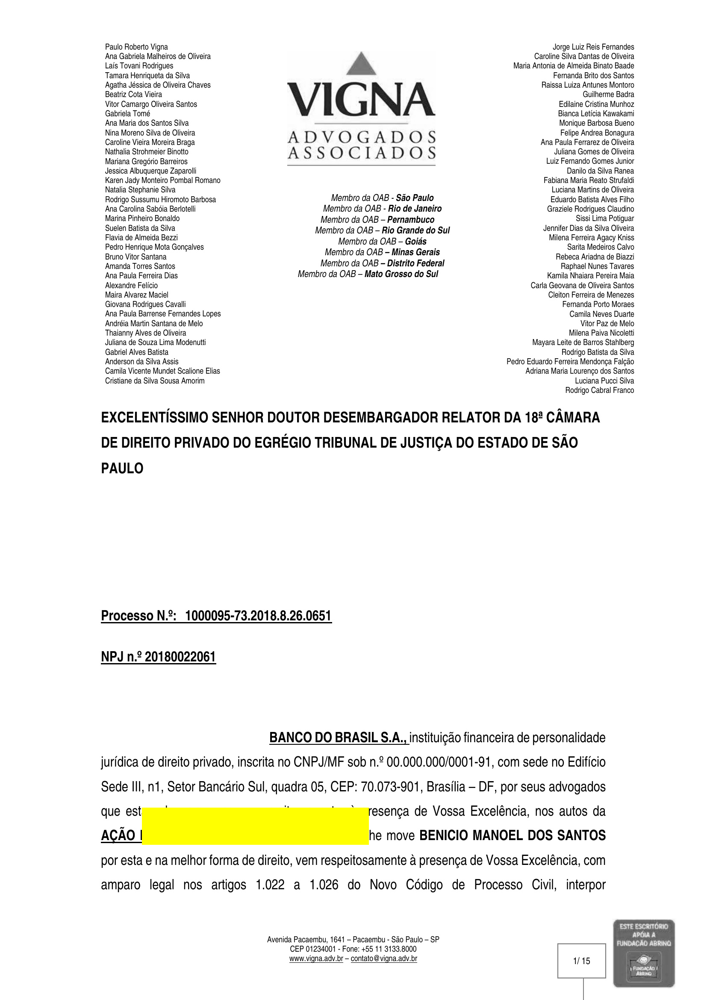

-0.15735583007335663 1.0


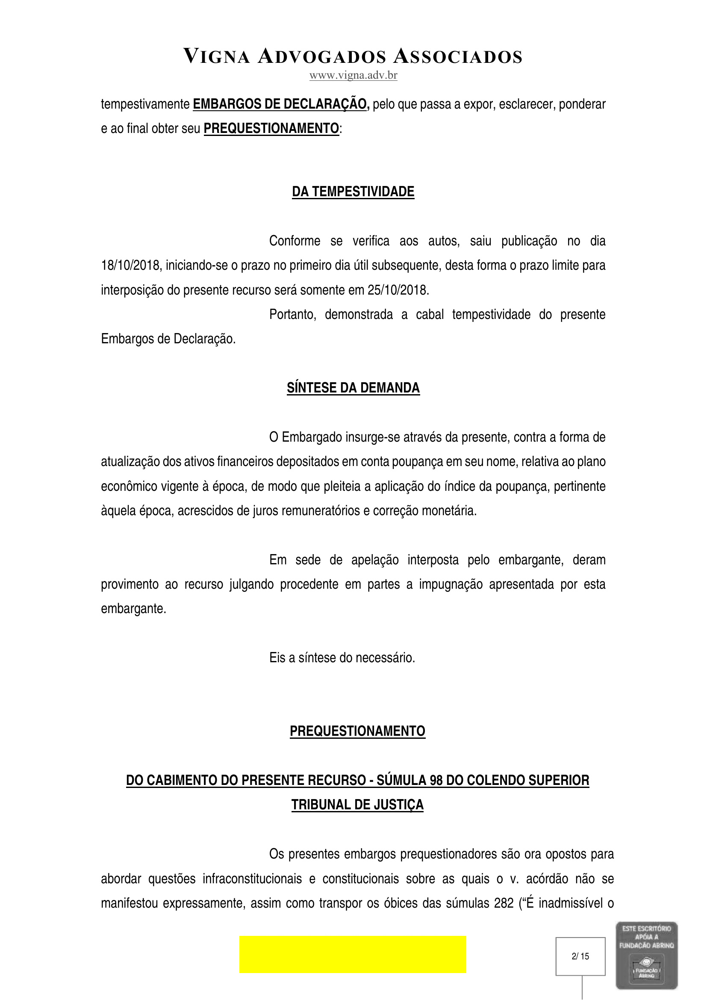

-0.15735583007335663 1.0


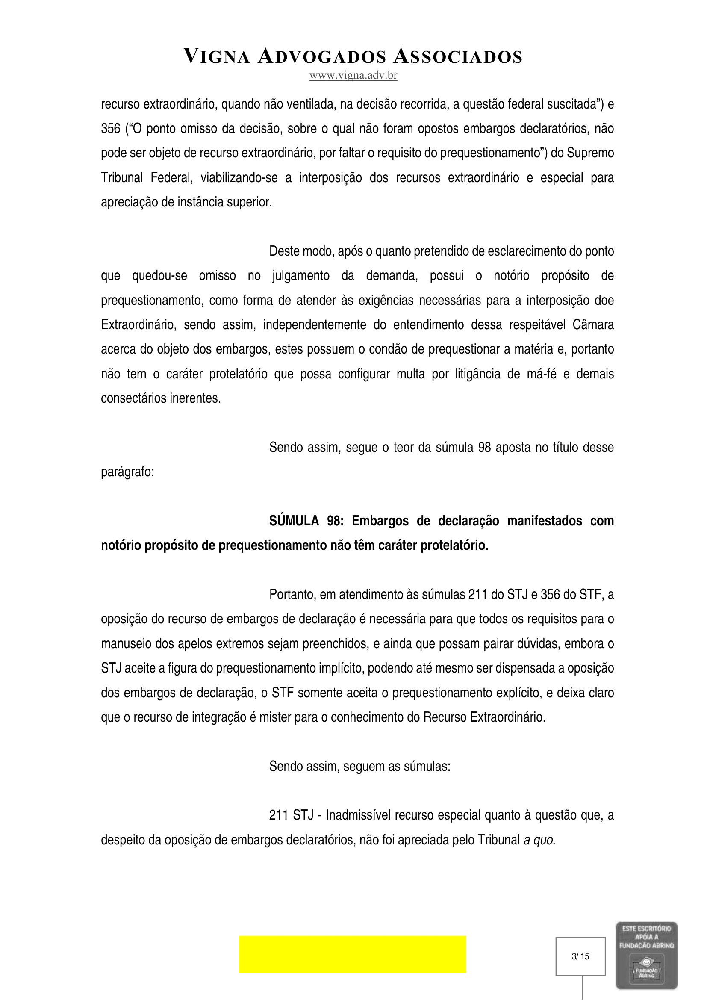

-0.15735778212547302 1.0


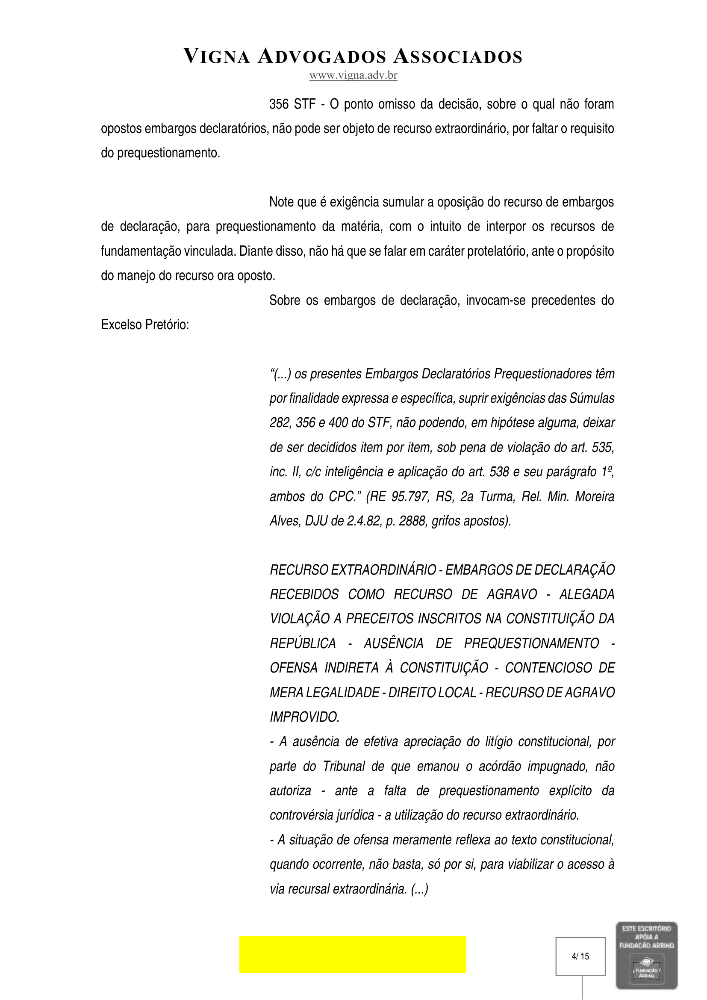

-0.15735778212547302 0.999999463558197


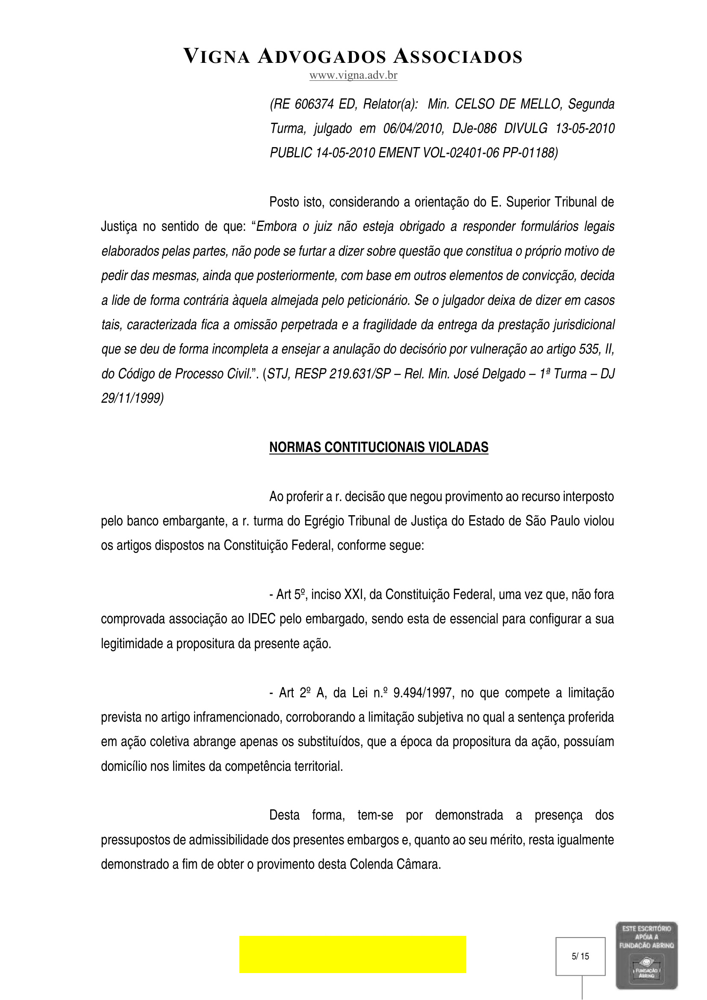

-0.15735583007335663 1.0


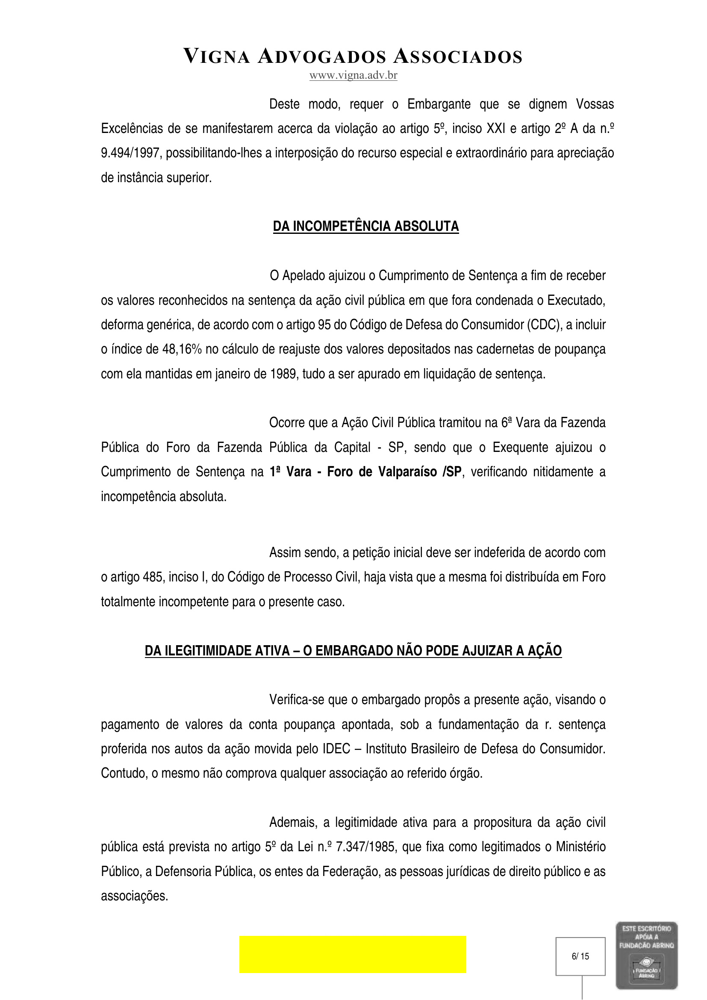

-0.15735971927642822 1.0


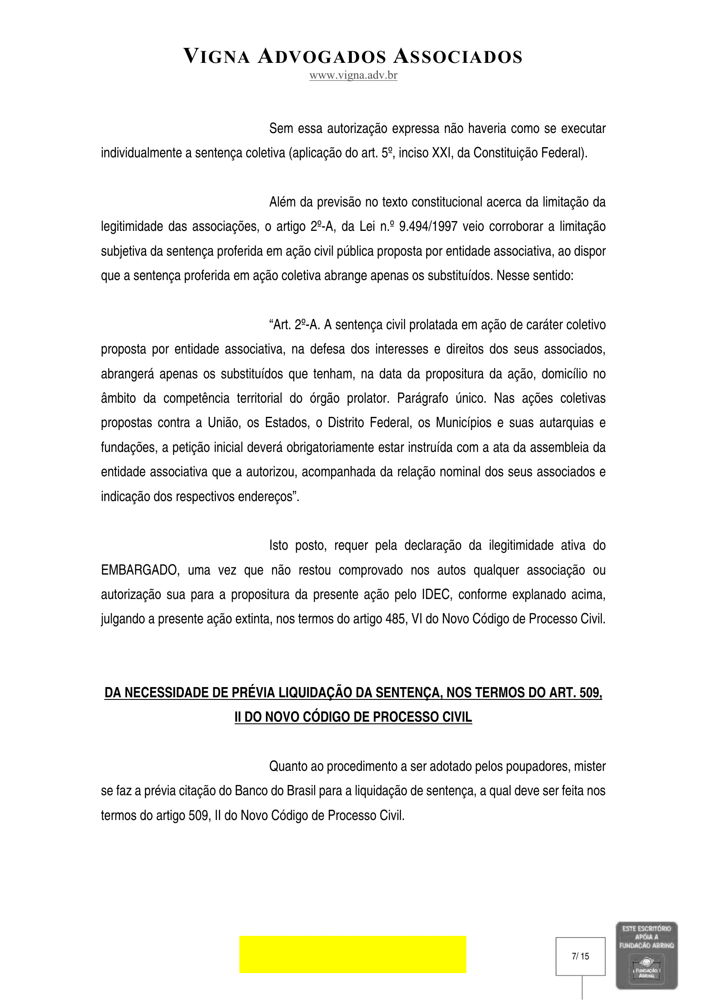

-0.15735583007335663 1.0


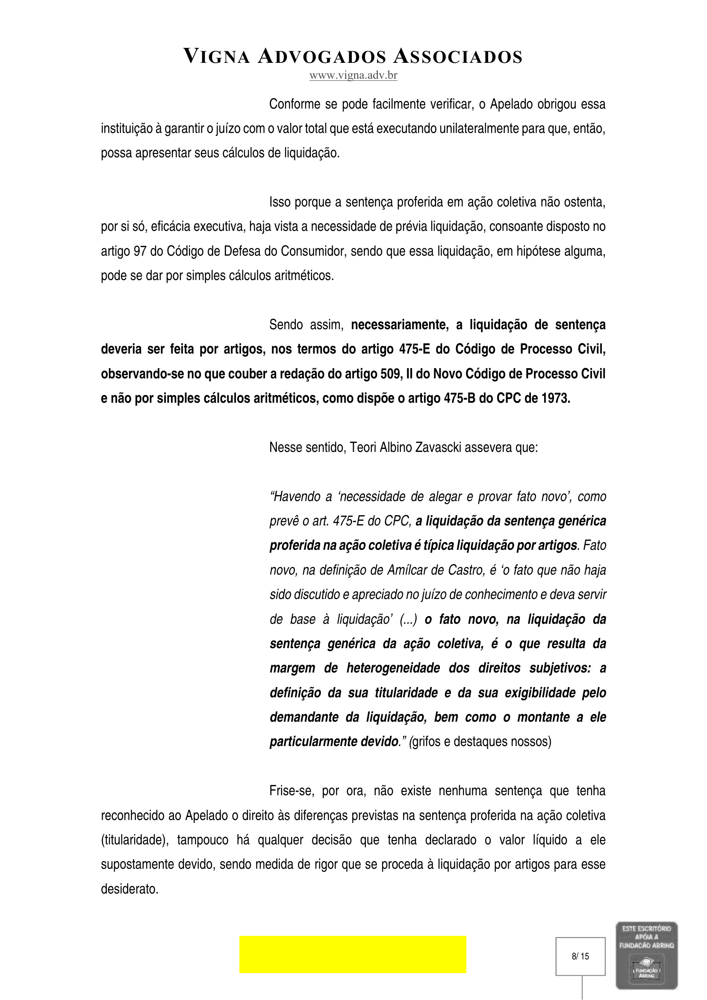

-0.15735486149787903 1.0


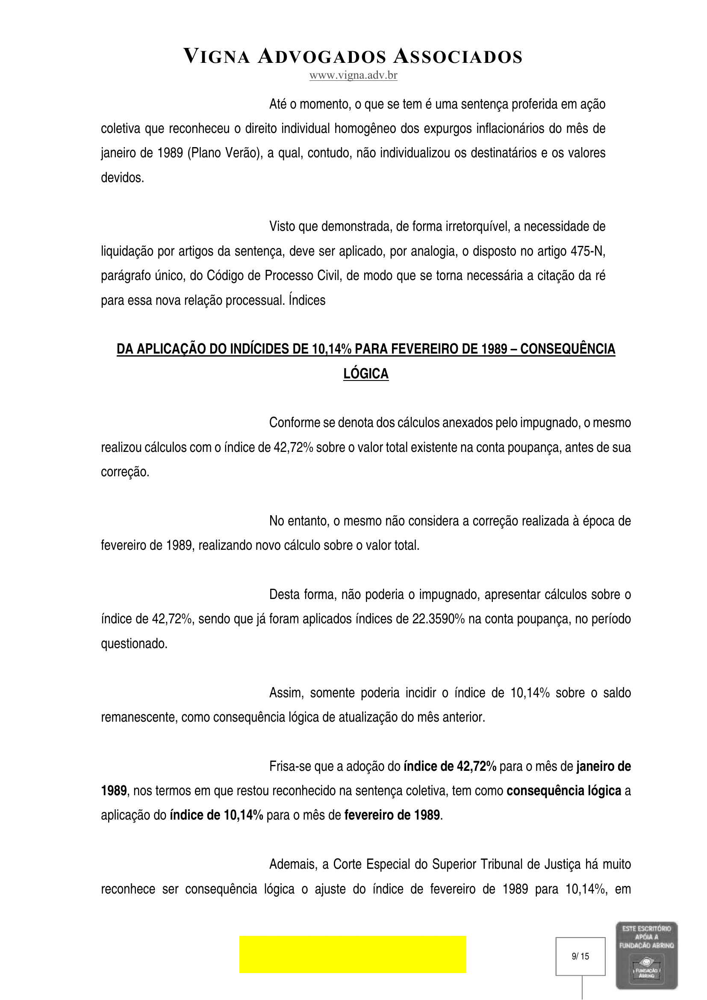

-0.15735583007335663 1.0


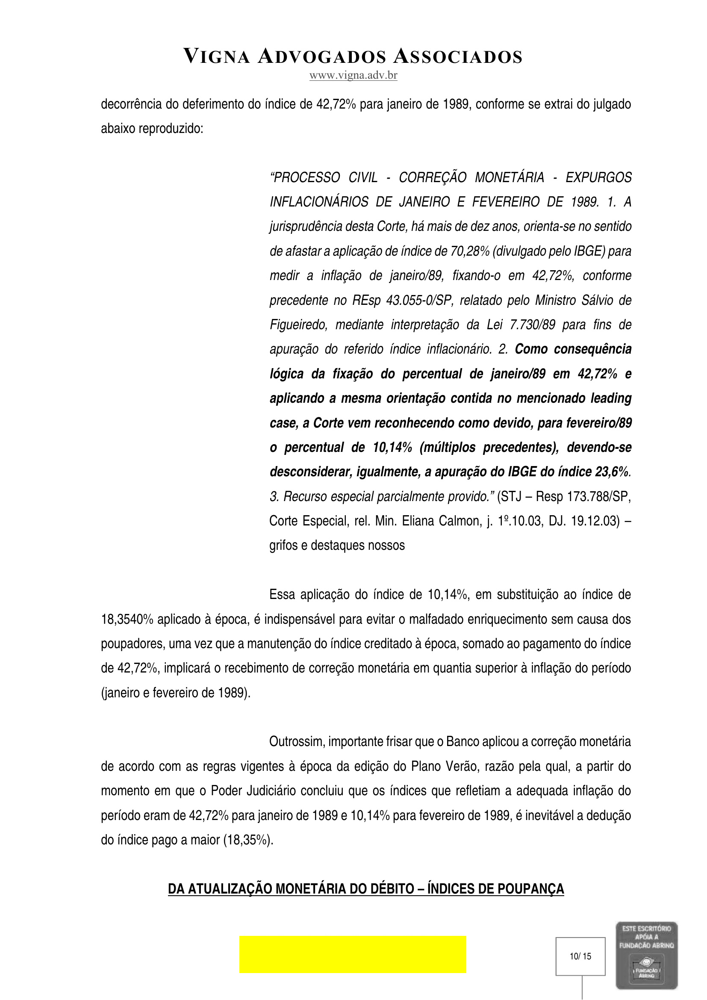

-0.15735583007335663 0.999999463558197


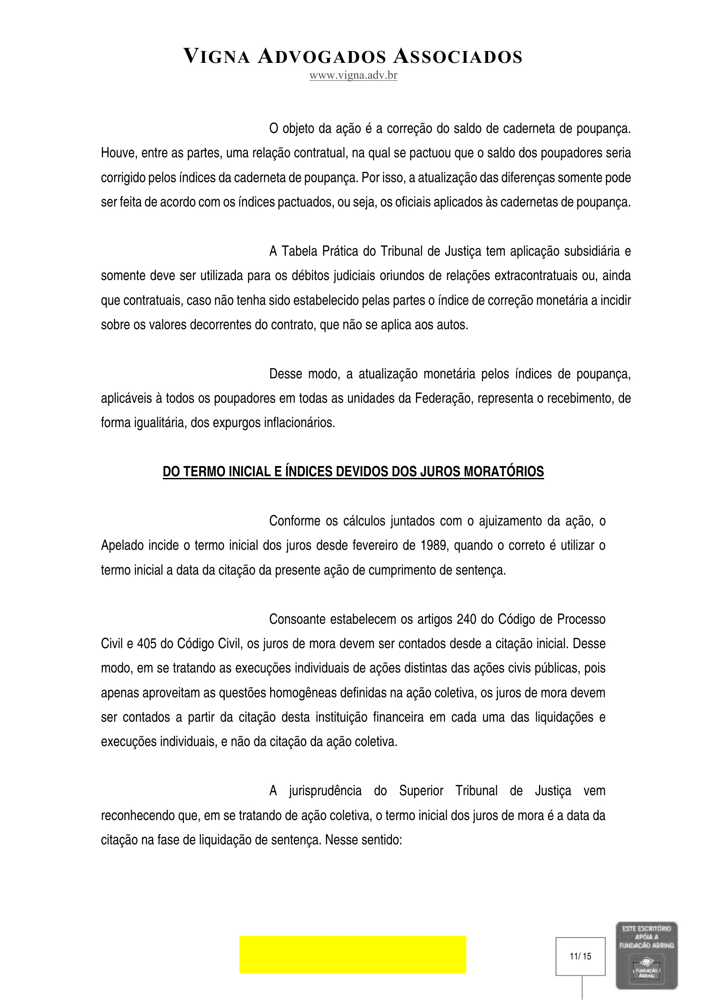

-0.15735583007335663 1.0


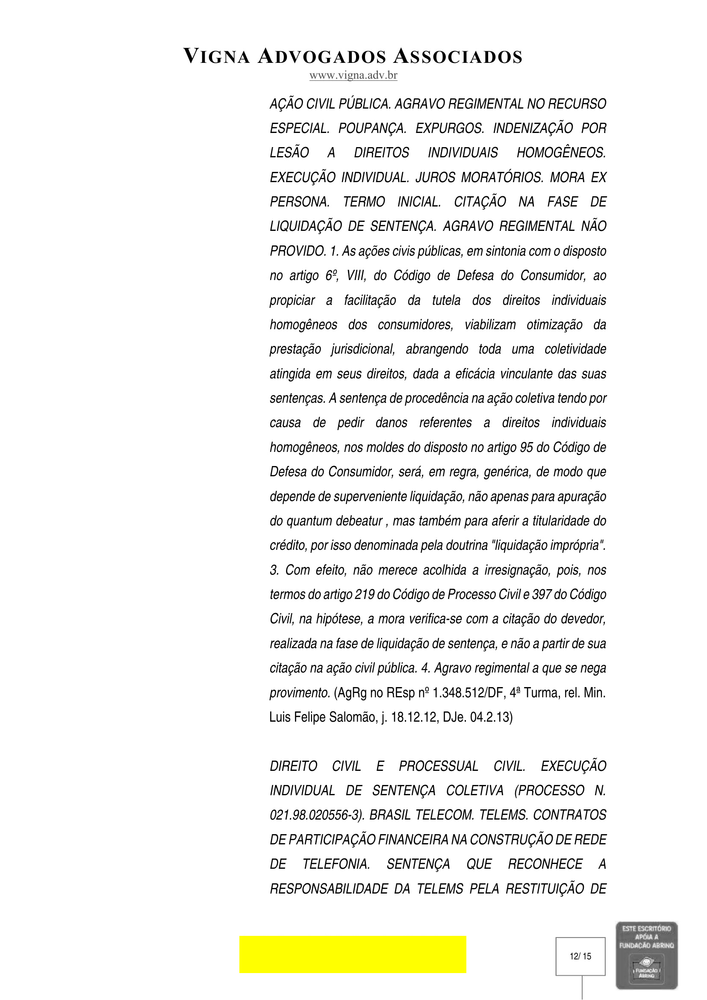

-0.15735778212547302 0.9999983906745911


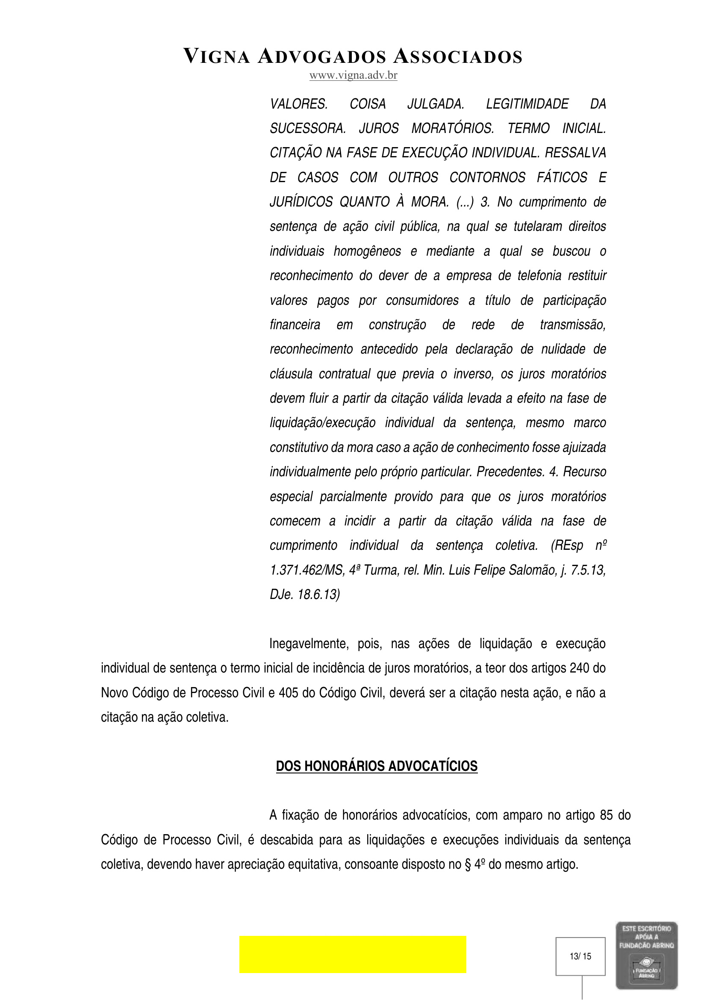

-0.15735583007335663 0.999999463558197


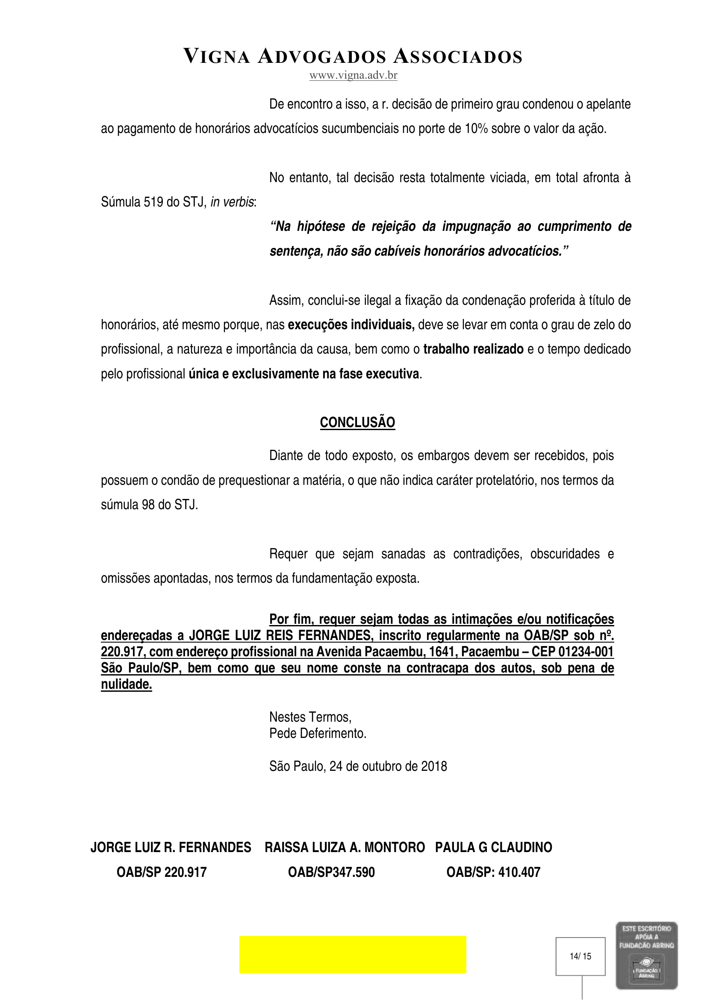

-0.15735583007335663 1.0


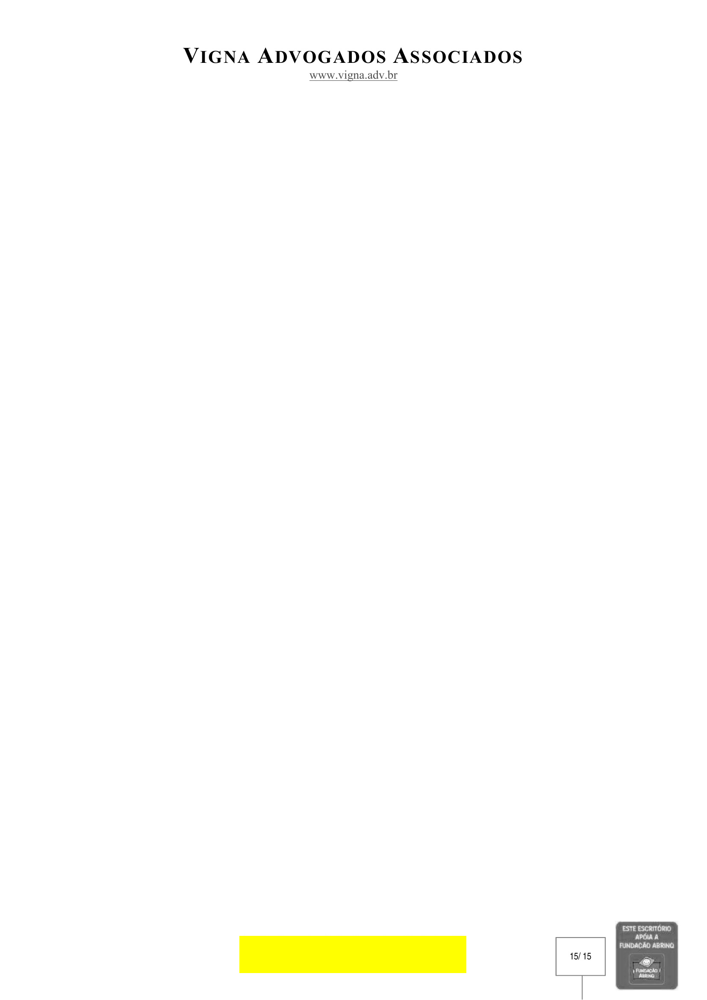

In [134]:
import cv2
import numpy as np

threshold = .1

altered_imgs = []

# for cropped things selected:
for img in img_list:
  full_image = img
  result = cv2.matchTemplate(full_image, cropped, cv2.TM_CCOEFF_NORMED)

  min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
  needle_w = cropped.shape[1]
  needle_h = cropped.shape[0]
  top_left = max_loc
  bottom_right = (top_left[0] + needle_w, top_left[1] + needle_h)

  if (min_val <= threshold):
    output = cv2.rectangle(full_image, top_left, bottom_right, (0, 255, 255), -1)
  
  altered_imgs.append(output)

  print(min_val, max_val)
  cv2_imshow(output)


# img_dir_list = os.listdir(cur_path + 'new_imgs')
#    # cria repositório das paginas de pdf  
# if f'1000095-73.2018.8.26.0651_168721135 - 1_Peticao' not in img_dir_list:
#   os.mkdir(f"{cur_path}new_imgs/{pdf}")

In [135]:
# Convert the images list to pdf
from PIL import Image

pil_imgs = list(map(lambda i: Image.fromarray(i), altered_imgs))
pil_imgs[0].save("out.pdf", save_all=True, quality=100, append_images=pil_imgs[1:])

[<PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E699CB90>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6A49750>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6072990>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6BB49D0>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E60729D0>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6072850>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E60727D0>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6072550>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6072890>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6072090>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6072110>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E60720D0>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6A9AF90>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E69E8750>, <PIL.Image.Image image mode=RGB size=1654x2339 at 0x7FA5E6072

In [137]:
#https://stackoverflow.com/questions/7853628/how-do-i-find-an-image-contained-within-an-image
#https://opencv-image-crop.herokuapp.com/